# Mushroom Edibility Classification

## Content

1. Introduction
2. Import Libraries
3. Data Loading
4. Exploratory Data Analysis (EDA)
5. Data Preprocessing
6. Model Definition
7. Model Training
8. Model Evaluation
9. Model Saving
10. Model Inference
11. Conclusion

##  1. Introduction 

#### Name : Abdurrahman Shiddiq Thaha

### 1.1 Background

Based on the recent [research](https://pubmed.ncbi.nlm.nih.gov/30062915/). In The US alone, over the last 18 years, 133700 cases (7428/year) of mushroom exposure, mostly by ingestion, have been reported. Roughly 704 (39/year) of them have resulted in major harm. Due to that fact, there is a need of a way to distinguish harmful and harmless fungi from each other, especially for those who are not that knowledgeable in foraging.

### 1.2 Problem Statement

Create a Deep Learning model to predict the edibility of a fungi to avoid harmful mushroom exposure.

## 2. Import Libraries 

These are libraries that are used in this assignment:

- pandas : Used to load and process data

- numpy : Used to do mathematical calculation necessary in the data analysis

- matplotlib : Used to visualize data

- seaborn : Used to do an alternative data visualization

- PIL : Used to do image processing

- tensorflow : Used to do deep learning procedure

- sklearn : Used to do classification evaluation

- pickle : used to create .pkl file for deployment

- pathlib : Used to provide API for working with files and directories

- warnings : Used to ignore any warning

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, array_to_img
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay
import pickle
import pathlib
import warnings

warnings.simplefilter('ignore')

# enable inline plotting
%matplotlib inline


sns.set_style(style='white')

# set the max columns to none
pd.set_option('display.max_columns', None)

# set the random seed
np.random.seed(420)

## 3. Data Loading 

We have been provided with 1 dataset . The description for what the dataset contain is given below: 


- **edible and poisonous fungi** : A dataset which contains image of poisonous and edible fungi

The details of the dataset can be seen here [Here](https://www.kaggle.com/datasets/marcosvolpato/edible-and-poisonous-fungi)


In [2]:
# initiate path for each class in our data

edible_dir = pathlib.Path('data/edible')
poison_dir = pathlib.Path('data/poisonous')

## 4. Exploratory Data Analysis (EDA)

There are 2 datatypes in the dataset:

1. Target
2. Image

### • Target

We will see the distribution of our target

In [3]:
# Create lists that contain every single image in each class and count the length
edible_count = len(list(edible_dir.glob('*')))
poison_count = len(list(poison_dir.glob('*')))

# make the list into an array
target_count = np.array([edible_count, poison_count])

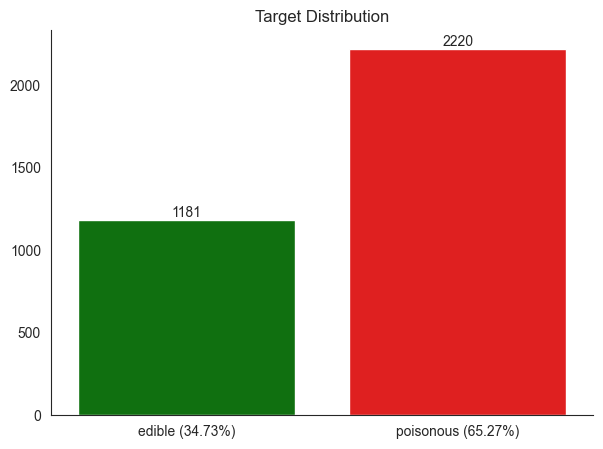

In [108]:
plt.figure(figsize=(7,5))

_ = sns.barplot(x=['edible', 'poisonous'], y=target_count, palette=['green', 'red'])
_.bar_label(_.containers[0]);

pct_0 = target_count[0]*100 / target_count.sum()

_.set_xticklabels([f'edible ({pct_0:.2f}%)', f'poisonous ({100-pct_0:.2f}%)']);
_.set_title(f'Target Distribution')
_.grid(False)
sns.despine()

plt.tight_layout;

As can be seen above, the proportion of label in our target is moderately imbalance. We only have **1181** data that is considered label `1` or edible which makes it the minority class. Compared to **2220** of data which is considered as label `0` or poisonoous which we can call as the majority class. With this proportion, we can say that our data is mildly imbalanced which we will not do any imbalanced handling since the data is image and doing an undersampling will discard a lot of information.

### • Image

We will just show the sample of image for each label

In [201]:
# initiate a function to show image
def image_show(dir, n, length=25, width=5, title='', random=True):
    fig, axes = plt.subplots(int(np.ceil(n/5)), 5, figsize=(length, width))
    image = list(dir.glob('*'))
    axes = axes.flatten()
    if random == True:
        random_num = np.random.randint(len(image), size=n)
    else:
        random_num = range(n)
    
    for i, ax in zip(random_num, axes):
        ax.imshow(PIL.Image.open(str(image[i])))
        ax.axis('off')
        
    fig.suptitle(f'{title}', size=30)
    plt.tight_layout()
        
    

#### • Edible

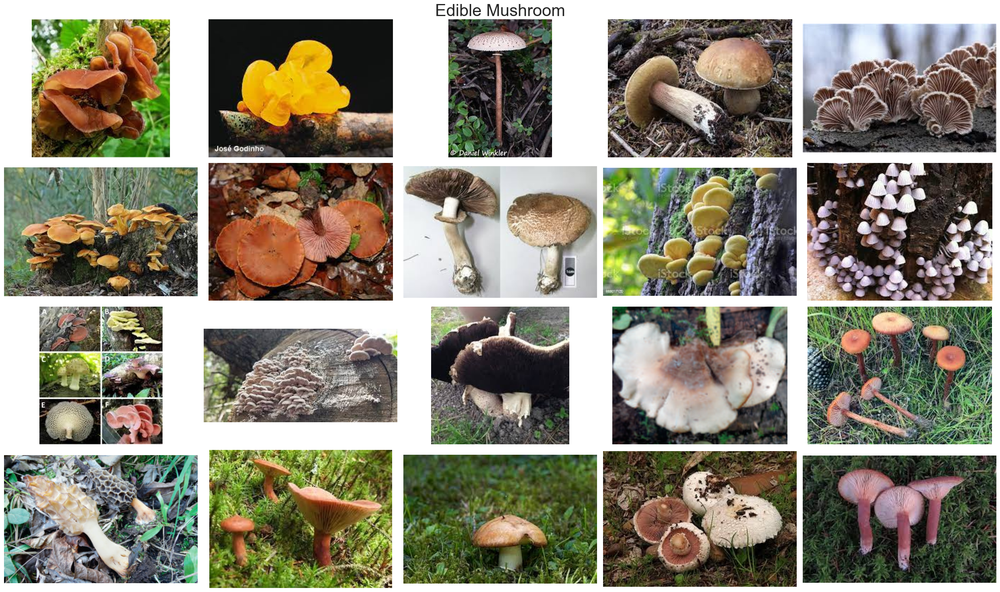

In [5]:
image_show(edible_dir, 20, width=15, title='Edible Mushroom')

According to the sample we have above, it seems that the edible mushrooms are more neutral in color and white and brown are the most common color. regarding the shape, it is actually a little bit hard to tell the pattern.

#### • Poisonous

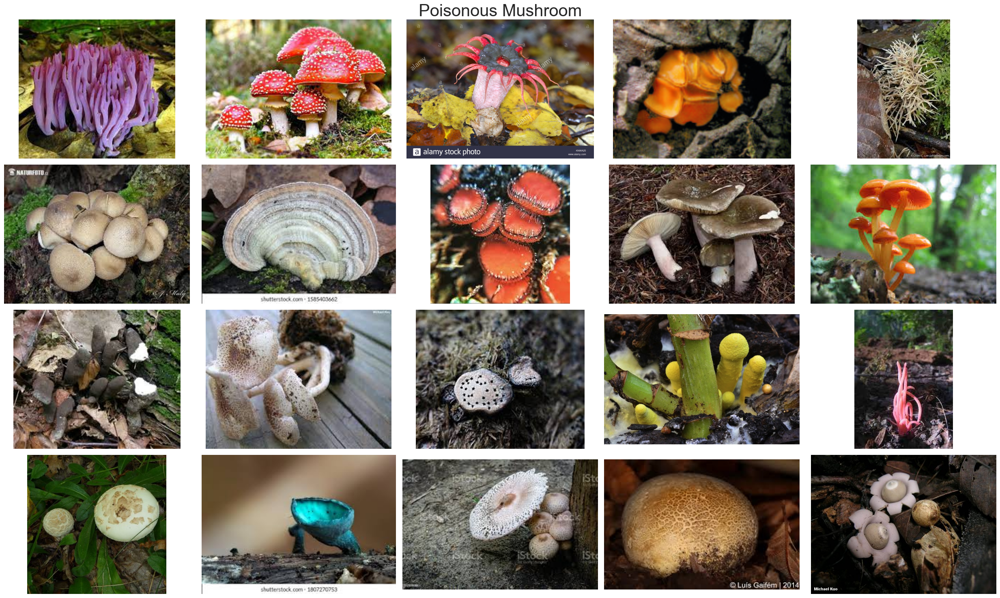

In [8]:
image_show(poison_dir, 20, width=15, title='Poisonous Mushroom')

In a glance, we can observe that poisonous mushrooms are more vibrant in color compared to the edible ones, although shape-wise, maybe we can still distinguish it. But still, there are some edible and poisonous mushrooms that look very similar.

## 5. Data Preprocessing

### • Split data train, validation and test

In [61]:
input_folder = "data/train"
output = "data"

# split the data with a ration of 80%, 10%, and 10%
splitfolders.ratio(input_folder, output=output, seed=420, ratio=(0.8,0.1,0.1))

Copying files: 3401 files [00:11, 291.97 files/s]


In [9]:
# Assign each path of data to a variable
train_folder=r'data/train/'
val_folder=r'data/val/'
test_folder=r'data/test/'

In [10]:
# Initiate the dimention of picture that we will pass to the model
IMG_WIDTH=224
IMG_HEIGHT=224

# initiate the batch size for our data
batch_size=64

In [68]:
# initiate the train dataset
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    train_folder,
    shuffle=True,
    batch_size=batch_size,
    image_size=(IMG_HEIGHT, IMG_WIDTH)
    )

Found 2720 files belonging to 2 classes.


In [69]:
class_names = train_dataset.class_names
print(class_names)

['edible', 'poisonous']


We have 2 label, edible -> 0, and poisonous -> 1

In [12]:
# initiate the validation dataset
val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    val_folder,
    shuffle=True,
    batch_size=batch_size,
    image_size=(IMG_HEIGHT, IMG_WIDTH)
    )

Found 340 files belonging to 2 classes.


In [162]:
# initiate the train dataset
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    test_folder,
    shuffle=True,
    batch_size=batch_size,
    image_size=(IMG_HEIGHT, IMG_WIDTH)
    )

Found 341 files belonging to 2 classes.


### • Configure the dataset for performance

In [165]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.cache().prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.cache().prefetch(buffer_size=AUTOTUNE)

### • Scaling

we will scale the image by dividing each pixel with 255

In [153]:
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [168]:
# scaling every dataset
normalized_train = train_dataset.map(lambda x, y: (normalization_layer(x), y))
normalized_val = val_dataset.map(lambda x, y: (normalization_layer(x), y))
normalized_test = test_dataset.map(lambda x, y: (normalization_layer(x), y))

## 6. Model Definition

In [47]:

# Using Transfer learning MobileNetV2
base_model = tf.keras.applications.MobileNetV2(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                               include_top=False,
                                               weights='imagenet')
# use every parameter in MobileNetV2
base_model.trainable = False

In [70]:
# Create a sequential architecture
tf.keras.backend.clear_session()
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [71]:
# compile the model
model.compile(loss='binary_crossentropy', optimizer='Adam', metrics='accuracy')

In [72]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 62720)             0         
                                                                 
 dense (Dense)               (None, 128)               8028288   
                                                                 
 dense_1 (Dense)             (None, 32)                4128      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 10,290,433
Trainable params: 8,032,449
Non-trainable params: 2,257,984
_____________________________________

Based on the summary above, we only use roughly 2 millions parameter from MobileNetv2 and then add 2 Dense layers on top of it. In total we have around 10 millions parameters.

## 7. Model Training


We will fit the model into the train data that has been preprocessed

In [73]:
history = model.fit(normalized_train, epochs=20, validation_data=normalized_val);

Epoch 1/20
43/43 [==============================] - 114s 3s/step - loss: 1.4037 - accuracy: 0.6801 - val_loss: 0.6441 - val_accuracy: 0.6382
Epoch 2/20
43/43 [==============================] - 114s 3s/step - loss: 0.3562 - accuracy: 0.8581 - val_loss: 0.5156 - val_accuracy: 0.7647
Epoch 3/20
43/43 [==============================] - 100s 2s/step - loss: 0.1660 - accuracy: 0.9368 - val_loss: 0.5587 - val_accuracy: 0.7971
Epoch 4/20
43/43 [==============================] - 107s 2s/step - loss: 0.1025 - accuracy: 0.9621 - val_loss: 0.6358 - val_accuracy: 0.7676
Epoch 5/20
43/43 [==============================] - 110s 3s/step - loss: 0.0654 - accuracy: 0.9790 - val_loss: 0.6751 - val_accuracy: 0.7647
Epoch 6/20
43/43 [==============================] - 141s 3s/step - loss: 0.0215 - accuracy: 0.9978 - val_loss: 0.6029 - val_accuracy: 0.7853
Epoch 7/20
43/43 [==============================] - 119s 3s/step - loss: 0.0086 - accuracy: 1.0000 - val_loss: 0.6031 - val_accuracy: 0.8088
Epoch 8/20
43

## 8. Model Evaluation

In [112]:
def model_eval(history, model, ymax=0, ymin=0):
    name = (f'{model}').split('.')[3].split(' ')[0]
    fig, ax = plt.subplots(1,2, figsize=(30,10))
    fig.suptitle(f'{name} Method Evaluation', fontsize=25, weight='bold')

    plt.subplot(1,2,1)
    plt.title("Training and Validation Accuracy", fontsize=12)
    plt.plot(history.history['accuracy'],label="Training Accuracy")
    plt.plot(history.history['val_accuracy'], label="Validation Acccuracy")
    plt.ylabel("Accuracy", fontsize=12)
    plt.legend()
    plt.grid(linestyle='--')
    if ymax != 0:
        plt.yticks(np.arange(ymin, ymax, 0.01))

    plt.subplot(1,2,2)
    plt.title("Training and Validation Losses", fontsize=12)
    plt.plot(history.history['loss'], label="Training Loss")
    plt.plot(history.history['val_loss'], label="Validation Loss")
    plt.ylabel("Loss", fontsize=12)
    plt.legend()
    plt.grid(linestyle='--')

    plt.style.use('default')
    plt.show()
    
def matrix_eval(model, y_test):   
    # find the probability of each prediction
    y_test_prob = model.predict(normalized_test)

    # predict our target with test data
    y_test_pred = np.round(y_test_prob)
    
    # calculate the evaluation matrices
    fig, axes = plt.subplots(1, 1, figsize=(4, 4))

    print("="*20,"TEST","="*20)
    print(classification_report(y_test,y_test_pred,zero_division=0))
    print('AUC Score Test:',roc_auc_score(y_test,y_test_prob))
    print("\n")
    
    _ = ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred, ax=axes, colorbar=False, cmap='Greens')
    axes.set_title('Test Confusion Matrix')
    axes.grid(False)

    plt.tight_layout()

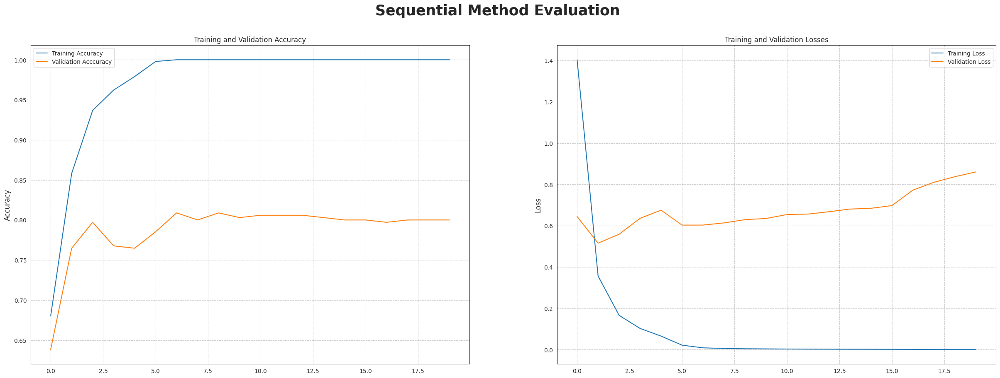

In [76]:
model_eval(history, model)

From the evaluation above, the result of the validation is not really good enough and it seems like it's way too overfitting as can be seen from the accuracy and the loss. So we can decide that this model must be improved.

In [170]:
# get the label from the test data
test_label = np.concatenate([y for x, y in test_dataset], axis=0) 
test_label

array([1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1,

6/6 [==============================] - 14s 2s/step
==================== TEST ====================
              precision    recall  f1-score   support

           0       0.71      0.63      0.67       119
           1       0.81      0.86      0.84       222

    accuracy                           0.78       341
   macro avg       0.76      0.75      0.75       341
weighted avg       0.78      0.78      0.78       341

AUC Score Test: 0.8415095768036945




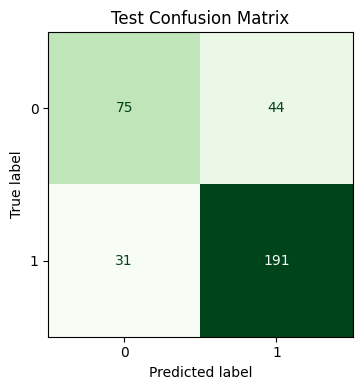

In [171]:
matrix_eval(model, test_label)

First of all, It is crucial to determine what kind of evaluation that can evaluate our case properly, since our basic idea of predicting whether a mushroom is edible or poisonous is to deliberately avoid any harmful mushroom exposure. Due to that reason, the appropiate evaluation matrix is **recall** which measure the number of correct poisonous prediction made out all of poisonous predictions that could have been made.

With that basis. In this model, the recall is pretty good with a value of 0.86, it is also can be seen in the confusion matrix where there are not a lot of wrong prediction on predicted as `0` but it is supposed to be `1`

### • Model Improvement

After conducting the first modelling, we can do an improvement to further increase the our model performance, this is the improvement that we have done to the data"
- Adding data augmentation
- Adding extra layer (Global Average Pooling)
- Adding Batch Normalization
- Adding Dropout
- Adding gradient clipping
- Adding Weight initializer

In [172]:
data_augmentation = tf.keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)

In [175]:
# Create a sequential architecture
tf.keras.backend.clear_session()
model_improved = tf.keras.Sequential([
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(rate=0.3),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(rate=0.3),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [176]:
model_improved.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               163968    
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                        

Suprisingly, after we improve our model. Based on the summary above, we found out that the number of parameters that our model should train is considerably smaller than our previous one which is only around 160.000 paramaeters.

In [237]:
# compile the model
model_improved.compile(loss='binary_crossentropy',optimizer=tf.keras.optimizers.Adam(clipvalue=0.1), metrics='accuracy')

In [179]:
# train the model
history_improved = model_improved.fit(normalized_train, epochs=20, validation_data=normalized_val);

Epoch 1/20
43/43 [==============================] - 132s 3s/step - loss: 0.6883 - accuracy: 0.6412 - val_loss: 0.5393 - val_accuracy: 0.7206
Epoch 2/20
43/43 [==============================] - 124s 3s/step - loss: 0.5298 - accuracy: 0.7382 - val_loss: 0.4974 - val_accuracy: 0.7559
Epoch 3/20
43/43 [==============================] - 127s 3s/step - loss: 0.4632 - accuracy: 0.7798 - val_loss: 0.4705 - val_accuracy: 0.7735
Epoch 4/20
43/43 [==============================] - 121s 3s/step - loss: 0.4207 - accuracy: 0.8004 - val_loss: 0.4590 - val_accuracy: 0.7971
Epoch 5/20
43/43 [==============================] - 118s 3s/step - loss: 0.3845 - accuracy: 0.8213 - val_loss: 0.4700 - val_accuracy: 0.7706
Epoch 6/20
43/43 [==============================] - 121s 3s/step - loss: 0.3742 - accuracy: 0.8324 - val_loss: 0.4614 - val_accuracy: 0.7882
Epoch 7/20
43/43 [==============================] - 118s 3s/step - loss: 0.3424 - accuracy: 0.8577 - val_loss: 0.4481 - val_accuracy: 0.7824
Epoch 8/20
43

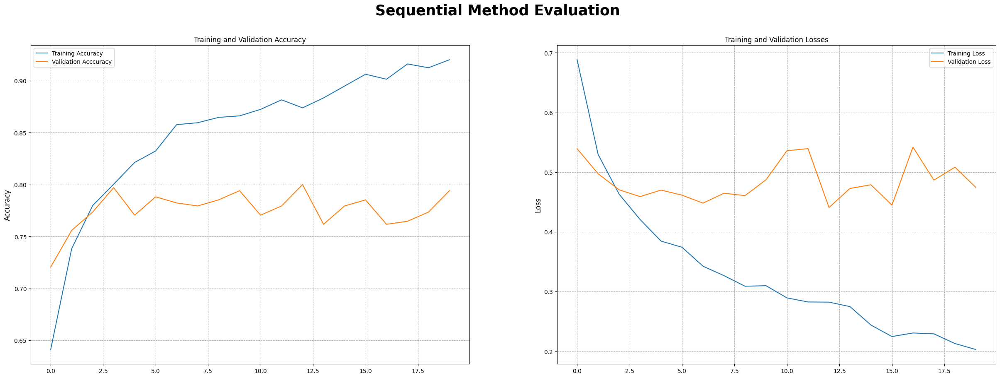

In [180]:
model_eval(history_improved, model_improved)

After being improved, it seems that there is no improvement at all, but if we look closer the model is less overfit eventhough it still it. from the figure above, we are able to say that the best model happens at epoch=3

6/6 [==============================] - 16s 2s/step
==================== TEST ====================
              precision    recall  f1-score   support

           0       0.68      0.63      0.66       119
           1       0.81      0.84      0.83       222

    accuracy                           0.77       341
   macro avg       0.75      0.74      0.74       341
weighted avg       0.76      0.77      0.77       341

AUC Score Test: 0.8595275948217125




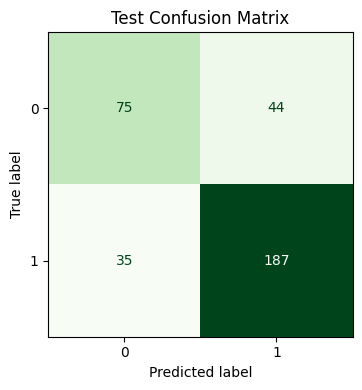

In [182]:
matrix_eval(model_improved, test_label)

Weirdly enough, the recall is decreasing quite a bit although it has been improved. the recall is 0.84 which is still decent from the previous one which is 0.86. But according to the graph of accuracy and loss, the model is less overfit hence We will use this model for our chosen one.

## 9. Model Saving

As have been mentioned earlier, the best fit of the model happens at epoch=3 therefore we will train our model again with epoch=3

In [183]:
tf.keras.backend.clear_session()
history_saving = model_improved.fit(normalized_val, epochs=3, validation_data=normalized_val);

Epoch 1/3
6/6 [==============================] - 24s 4s/step - loss: 0.5484 - accuracy: 0.7853 - val_loss: 0.4280 - val_accuracy: 0.8059
Epoch 2/3
6/6 [==============================] - 25s 4s/step - loss: 0.4000 - accuracy: 0.8176 - val_loss: 0.3653 - val_accuracy: 0.8353
Epoch 3/3
6/6 [==============================] - 23s 4s/step - loss: 0.3373 - accuracy: 0.8176 - val_loss: 0.3172 - val_accuracy: 0.8529


In [185]:
# freeze model
model_improved.trainable = False

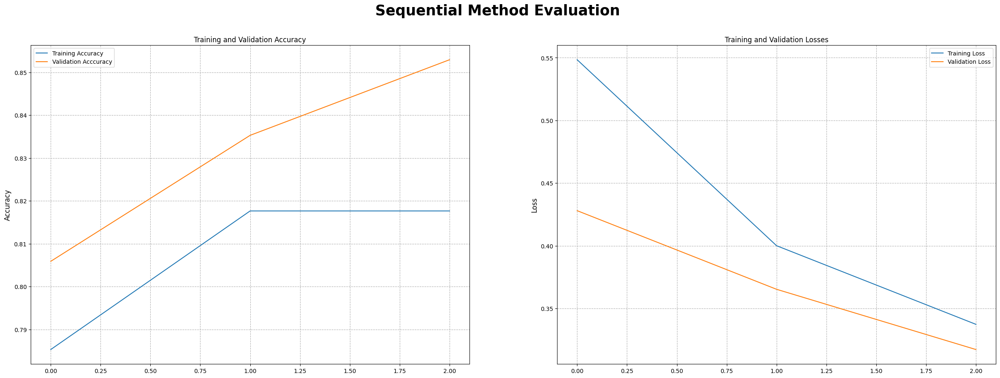

In [186]:
model_eval(history_saving, model_improved)

Similar to the improvement that we have conducted, the best fit happens at epoch = 3

6/6 [==============================] - 14s 2s/step
==================== TEST ====================
              precision    recall  f1-score   support

           0       0.74      0.59      0.66       119
           1       0.80      0.89      0.84       222

    accuracy                           0.79       341
   macro avg       0.77      0.74      0.75       341
weighted avg       0.78      0.79      0.78       341

AUC Score Test: 0.8375350140056023




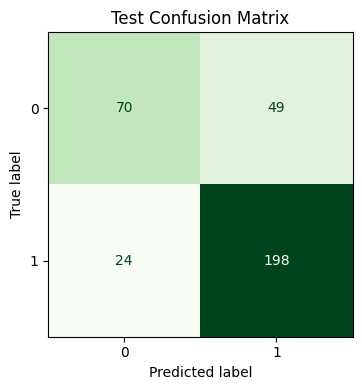

In [187]:
matrix_eval(model_improved, test_label)

The recall value is 0.89, suprisingly it is increasing which is a desirable outcome.

In [188]:
# Saving model
model_improved.save("mushroom_model.h5")

### • Preprocessing Pipeline

In [189]:
# initiate preprocess pipeline

normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [190]:
# save the pipeline
pickle.dump(normalization_layer, open('preprocess.pkl', 'wb'))

## 10. Model Inference

In [210]:
inference_dir = pathlib.Path('data/inference')

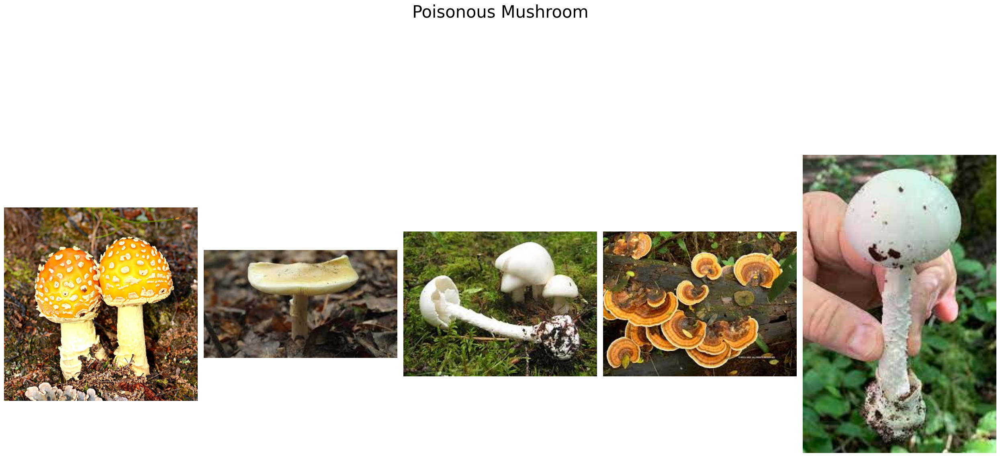

In [203]:
image_show(inference_dir, 5, width=15, title='Poisonous Mushroom', random=False)

In [215]:
# initiate the validation dataset
inf_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    inference_dir,
    shuffle=False,
    image_size=(IMG_HEIGHT, IMG_WIDTH)
    )

Found 7 files belonging to 2 classes.


In [218]:
# normalized our dataset
normalized_inf = inf_dataset.map(lambda x, y: (normalization_layer(x), y))

In [220]:
# get the label of each image
inf_label = np.concatenate([y for x, y in normalized_inf], axis=0) 
inf_label

array([0, 0, 1, 1, 1, 1, 1])

In [223]:
# find the probability of each prediction
y_inf_prob = model_improved.predict(normalized_inf)

# predict our target with test data
y_inf_pred = np.round(y_inf_prob)
y_inf_pred

1/1 [==============================] - 0s 293ms/step


array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]], dtype=float32)

In [236]:
# Comparing the result of the true label and the prediction
pd.DataFrame({'True label': inf_label.flatten(), 'Prediction Label': y_inf_pred.flatten().astype(int)})

,True label,Prediction Label
0,0,1
1,0,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1


We have done model inferential

## 11. Conclusion 

Just to mention it one more time, our aim for this project is to predict the edibility of fungi to avoid mushroom exposure. With that in mind, we have gathered the data that is suitable for our case. Our data contains image of edible and poisonous fungi. It is quite difficult to distinguish which one is an edible mushroom in the wild without the proper foraging knowledge, but in general, based on our observation the poisonous mushroom tend to have a more vibrant color compared to the edible one although we cannot generalize for every single one.

The next one is about how we should evaluate our model, this is very essential since this case can be a life or death kind of situation. So, with that in mind, we desire our model to be able correctly predict poisonous mushroom, hence the best evaluation matrix that we can use is **recall**

move to  the model that we have created. since we used deep learning, we created utilize Convolutional Neural Network algorithm and then performed improvement on it. after doing the modeling, we came up with the best model that has 0.89 recall which is very decent.

In summary, we have succeded to create the model that was performing quite good, however, we are fully aware that there are a lot of thing to be improved. Due to that fact, we suggest for whoever wants to do similar work to find a lot more data and create a superior neural network architecture.